In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from scipy.stats import zscore
from scipy.spatial.distance import pdist
from sklearn.cluster import SpectralClustering
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, fcluster, leaves_list
from sklearn.metrics import silhouette_score, pairwise_distances_argmin, pairwise_distances
from sklearn.metrics.pairwise import euclidean_distances
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
import seaborn as sns
from matplotlib.colors import ListedColormap
import os
import joblib
import pickle

## Description

- Parameters:
  - K: number of clusters ( decide the best K according to validation dataset)
  - B: number of bootstrap iterations
  - random seed

- Input:
  - X: [N x D] matrix, N samples with D features (e.g. MOFA+ latent factors)

- Output:
  - A consensus matrix for trainning data
  - Stable cluster labels (length-N vector)
  - Trained Kmeans model
  - other visuliztion of clustering stability and confidence

## Part 0: Run real data (Updated: 07/07)

In [ ]:
data_integration_file_path = "/content/drive/MyDrive/DS_project/Data/5_Inter-cohort_preprocessing/5.5Multi-omics_integration/Z_output/"


with open(data_integration_file_path + '30mixed_train_latent_output.pickle', 'rb') as f:
    train_latent_output = pickle.load(f)

with open(data_integration_file_path + '30mixed_val_latent_output.pickle', 'rb') as f:
    val_latent_output = pickle.load(f)

with open(data_integration_file_path + '30mixed_external_test_latent_output.pickle', 'rb') as f:
    external_test_latent_output = pickle.load(f)

with open(data_integration_file_path + '30mixed_internal_test_latent_output.pickle', 'rb') as f:
    internal_test_latent_output = pickle.load(f)

In [ ]:
print("Train:", len(train_latent_output))
print("Val:", len(val_latent_output))
print("External Test:", len(external_test_latent_output))
print("Internal Test:", len(internal_test_latent_output))

Train: 605
Val: 120
External Test: 130
Internal Test: 155


In [ ]:
for i in range(3):
    print(f"\ntrain_latent_output[{i}] =")
    print(train_latent_output[i])


train_latent_output[0] =
{'sample_id': 'TCGA-02-0001-01C', 'latent_vector': array([-0.10540274,  0.24671064, -1.4465876 ,  9.3332615 ,  0.3424647 ,
       -1.2736757 , -0.03019458,  2.4175858 ,  0.24073783, -1.2244269 ,
       -0.53105104,  1.3477567 , -0.7312203 , -1.3355743 , -0.3739681 ,
       -0.8984204 ,  1.7560643 ,  0.1425098 , -0.68942046, -0.75674313,
       -1.1782669 ,  0.12583646,  0.2881953 ,  0.4221838 , -0.5763988 ,
       -1.1770281 ,  0.7572402 ,  5.1193967 , -0.54380536, -1.0352463 ],
      dtype=float32), 'label': 'GBM'}

train_latent_output[1] =
{'sample_id': 'TCGA-02-0003-01A', 'latent_vector': array([ 0.23740949,  0.8606015 , -1.4027663 ,  0.52563024,  0.79652387,
       -2.2082536 , -0.14444901, -1.1917152 ,  0.06155805,  0.5385262 ,
       -0.8309338 ,  2.674111  , -0.21928659,  4.855896  ,  1.278341  ,
        1.419255  ,  0.03127774, -0.10753722, -3.3693893 , -1.4980261 ,
       -0.9523671 , -0.84036   , -0.01213595,  0.3037364 , -0.5388994 ,
        0.28515

#### check input

In [ ]:
from collections import Counter

datasets = {
  "train": train_latent_output,
  "val": val_latent_output,
  "internal_test": internal_test_latent_output,
  "external_test": external_test_latent_output
}

label_counts = {}

for set_name, data_list in datasets.items():
  label_counter = Counter([sample['label'] for sample in data_list])
  label_counts[set_name] = dict(label_counter)

for set_name, counts in label_counts.items():
  print(f"\n=== {set_name.upper()} ===")
  for label, count in counts.items():
    print(f"{label}: {count}")


=== TRAIN ===
GBM: 293
LGG: 312

=== VAL ===
GBM: 55
LGG: 65

=== INTERNAL_TEST ===
GBM: 83
LGG: 72

=== EXTERNAL_TEST ===
GBM: 64
LGG: 66


#### Prepare input

In [ ]:
datasets = {
    "train": train_latent_output,
    "val": val_latent_output,
    "internal_test": internal_test_latent_output,
    "external_test": external_test_latent_output
}


GBM = {
    "train": pd.DataFrame(),
    "val": pd.DataFrame(),
    "internal_test": pd.DataFrame(),
    "external_test": pd.DataFrame()
}

LGG = {
    "train": pd.DataFrame(),
    "val": pd.DataFrame(),
    "internal_test": pd.DataFrame(),
    "external_test": pd.DataFrame()
}

for set_name, data_list in datasets.items():
  for sample in data_list:
    sample_id = sample['sample_id']
    label = sample['label']  # 'GBM' or 'LGG'
    vector = sample['latent_vector']

    df_row = pd.DataFrame([vector], columns=[f"Factor{i+1}" for i in range(len(vector))], index=[sample_id])

    if label == 'GBM':
      GBM[set_name] = pd.concat([GBM[set_name], df_row])
    elif label == 'LGG':
      LGG[set_name] = pd.concat([LGG[set_name], df_row])
    else:
      print(f"unknown: {label}, {sample_id}")


print("GBM Train:")
print(GBM["train"].head(2))

print("\nGBM Val shape:", GBM["val"].shape, GBM["val"].head(2))
print("\nGBM internal_test shape:", GBM["internal_test"].shape, GBM["internal_test"].head(2))
print("\nGBM external_test shape:", GBM["external_test"].shape, GBM["external_test"].head(2))

print("\nLGG Val shape:", LGG["val"].shape)

GBM Train:
                   Factor1   Factor2   Factor3   Factor4   Factor5   Factor6  \
TCGA-02-0001-01C -0.105403  0.246711 -1.446588  9.333261  0.342465 -1.273676   
TCGA-02-0003-01A  0.237409  0.860601 -1.402766  0.525630  0.796524 -2.208254   

                   Factor7   Factor8   Factor9  Factor10  ...  Factor21  \
TCGA-02-0001-01C -0.030195  2.417586  0.240738 -1.224427  ... -1.178267   
TCGA-02-0003-01A -0.144449 -1.191715  0.061558  0.538526  ... -0.952367   

                  Factor22  Factor23  Factor24  Factor25  Factor26  Factor27  \
TCGA-02-0001-01C  0.125836  0.288195  0.422184 -0.576399 -1.177028   0.75724   
TCGA-02-0003-01A -0.840360 -0.012136  0.303736 -0.538899  0.285158   0.44576   

                  Factor28  Factor29  Factor30  
TCGA-02-0001-01C  5.119397 -0.543805 -1.035246  
TCGA-02-0003-01A -4.284283  2.412422  0.770632  

[2 rows x 30 columns]

GBM Val shape: (55, 30)                    Factor1   Factor2     Factor3     Factor4   Factor5  \
TCGA-02-0006

#### combine GBM and LGG


In [ ]:
merged_datasets = {
  "train": pd.DataFrame(),
  "val": pd.DataFrame(),
  "internal_test": pd.DataFrame(),
  "external_test": pd.DataFrame()
}


for set_name in merged_datasets.keys():
  gbm_df = GBM[set_name].copy()
  lgg_df = LGG[set_name].copy()

  if not gbm_df.empty:
    gbm_df['label'] = 'GBM'
    gbm_df['set'] = set_name
  if not lgg_df.empty:
    lgg_df['label'] = 'LGG'
    lgg_df['set'] = set_name

  merged_datasets[set_name] = pd.concat([gbm_df, lgg_df])

for name, df in merged_datasets.items():
  print(f"\n=== {name.upper()} ===")
  print(df.head(2))
  print("Shape:", df.shape)
  print("Label counts:\n", df['label'].value_counts())



=== TRAIN ===
                   Factor1   Factor2   Factor3   Factor4   Factor5   Factor6  \
TCGA-02-0001-01C -0.105403  0.246711 -1.446588  9.333261  0.342465 -1.273676   
TCGA-02-0003-01A  0.237409  0.860601 -1.402766  0.525630  0.796524 -2.208254   

                   Factor7   Factor8   Factor9  Factor10  ...  Factor23  \
TCGA-02-0001-01C -0.030195  2.417586  0.240738 -1.224427  ...  0.288195   
TCGA-02-0003-01A -0.144449 -1.191715  0.061558  0.538526  ... -0.012136   

                  Factor24  Factor25  Factor26  Factor27  Factor28  Factor29  \
TCGA-02-0001-01C  0.422184 -0.576399 -1.177028   0.75724  5.119397 -0.543805   
TCGA-02-0003-01A  0.303736 -0.538899  0.285158   0.44576 -4.284283  2.412422   

                  Factor30  label    set  
TCGA-02-0001-01C -1.035246    GBM  train  
TCGA-02-0003-01A  0.770632    GBM  train  

[2 rows x 32 columns]
Shape: (605, 32)
Label counts:
 label
LGG    312
GBM    293
Name: count, dtype: int64

=== VAL ===
                   Factor1

## Part 1: Unsupervised clustering methods construction (k-means)

### Functions: Bootstrap Consensus Clustering (k-means)

- Perform Consensus Clustering on the Training set
- Evaluate on the Validation set
- Clustering on Internal/External Test set
- Visualizing cluster assignment confidence

In [ ]:
def scale_data(X):
  scaler = StandardScaler()
  return scaler.fit_transform(X)

def bootstrap_consensus_clustering_kmeans(X_scaled, n_clusters,n_init=10,n_bootstraps=1000, SEED=42):
  n_samples = X_scaled.shape[0]
  cluster_assignments = []
  silhouette_scores = []

  consensus_matrix = np.zeros((n_samples, n_samples))
  co_occurrence_matrix = np.zeros((n_samples, n_samples))

  # Step 1: Bootstrap sampling
  for b in range(n_bootstraps):
    indices = np.random.choice(n_samples, size=n_samples, replace=True)
    X_boot = X_scaled[indices]

    #remove outliers
    #z_scores = np.abs(zscore(X_boot, axis=0))
    z_scores = np.abs(X_boot)
    mask = (z_scores < 3).all(axis=1)
    X_boot_filtered = X_boot[mask]
    filtered_indices = np.array(indices)[mask]

    outlier_indices = np.array(indices)[~mask]
    X_outliers = X_boot[~mask]

    if len(X_boot_filtered) < k:
        continue

    # Step 2: KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters,n_init=n_init,random_state=SEED)
    labels = kmeans.fit_predict(X_boot_filtered)
    cluster_assignments.append((labels, indices))
    centroids = kmeans.cluster_centers_

    # Step 3: Silhouette score
    if len(set(labels)) > 1:
      try:
        # two same points will unreasonably increase silhouette score
        X_unique, idx_unique = np.unique(X_boot_filtered, axis=0, return_index=True)
        sil = silhouette_score(X_unique, labels[idx_unique])
        silhouette_scores.append(sil)
      except:
        pass

    if len(outlier_indices) > 0:
        dists = euclidean_distances(X_outliers, centroids)
        outlier_labels = np.argmin(dists, axis=1)
    else:
        outlier_labels = []
    all_indices = np.concatenate([filtered_indices, outlier_indices])
    all_labels = np.concatenate([labels, outlier_labels])

    # Step 4: Build mini co-assignment matrix
    for i in range(len(all_indices)):
      for j in range(len(all_indices)):
        co_occurrence_matrix[all_indices[i], all_indices[j]] += 1
        if all_labels[i] == all_labels[j]:
          consensus_matrix[all_indices[i], all_indices[j]] += 1

  # Step 5: Normalize consensus matrix to [0, 1]
  with np.errstate(divide='ignore', invalid='ignore'):
    consensus_matrix = np.true_divide(consensus_matrix, co_occurrence_matrix)
    consensus_matrix[co_occurrence_matrix == 0] = 0

  silhouette_mean = np.mean(silhouette_scores)
  silhouette_var = np.var(silhouette_scores)

  full_kmeans = KMeans(n_clusters=n_clusters,n_init=n_init, random_state=SEED)
  full_kmeans.fit(X_scaled)
  full_sil = silhouette_score(X_scaled, full_kmeans.labels_)

  return consensus_matrix, cluster_assignments, silhouette_mean, silhouette_var, full_sil, full_kmeans


def bootstrap_consensus_clustering_kmeans_flexini(X_scaled, n_clusters,n_bootstraps=1000, SEED=42):
  n_samples = X_scaled.shape[0]
  cluster_assignments = []
  silhouette_scores = []

  consensus_matrix = np.zeros((n_samples, n_samples))
  co_occurrence_matrix = np.zeros((n_samples, n_samples))
  #k=2~4, n_init=5~10 and k=5~7, n_init=10~15.
  if n_clusters in range(2,5):
    n_init = 10
  elif  n_clusters in range(5,8):
    n_init = 15
  elif  n_clusters in range(9,11):
    n_init = 20
  else:
    n_init = 25
  # Step 1: Bootstrap sampling
  for b in range(n_bootstraps):
    indices = np.random.choice(n_samples, size=n_samples, replace=True)
    X_boot = X_scaled[indices]

    # Step 2: KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters,n_init=n_init,random_state=SEED)
    labels = kmeans.fit_predict(X_boot)
    cluster_assignments.append((labels, indices))

    # Step 3: Silhouette score
    if len(set(labels)) > 1:
      try:
        # two same points will unreasonably increase silhouette score
        X_unique, idx_unique = np.unique(X_boot, axis=0, return_index=True)
        sil = silhouette_score(X_unique, labels[idx_unique])
        silhouette_scores.append(sil)
      except:
        pass

    # Step 4: Build mini co-assignment matrix
    for i in range(len(indices)):
      for j in range(len(indices)):
        co_occurrence_matrix[indices[i], indices[j]] += 1
        if labels[i] == labels[j]:
          consensus_matrix[indices[i], indices[j]] += 1

  # Step 5: Normalize consensus matrix to [0, 1]
  with np.errstate(divide='ignore', invalid='ignore'):
    consensus_matrix = np.true_divide(consensus_matrix, co_occurrence_matrix)
    consensus_matrix[co_occurrence_matrix == 0] = 0

  silhouette_mean = np.mean(silhouette_scores)
  silhouette_var = np.var(silhouette_scores)

  full_kmeans = KMeans(n_clusters=n_clusters,n_init=n_init, random_state=SEED)
  full_kmeans.fit(X_scaled)
  full_sil = silhouette_score(X_scaled, full_kmeans.labels_)

  return consensus_matrix, cluster_assignments, silhouette_mean, silhouette_var, full_sil, full_kmeans

def extract_stable_clusters(consensus_matrix, n_clusters,method,criterion='maxclust'):
  if method == 'spectral':
    spectral = SpectralClustering(
        n_clusters=n_clusters,
        affinity='precomputed',
        assign_labels='kmeans',
        random_state=0
    )
    cluster_labels = spectral.fit_predict(consensus_matrix)

  elif method in ["average", "complete","single"]:
    similarity = consensus_matrix.copy()
    np.fill_diagonal(similarity, 1.0)
    distance = 1 - similarity

    dist_vector = pdist(distance)
    Z = linkage(dist_vector, method=method)

    cluster_labels = fcluster(Z, t=n_clusters, criterion=criterion)
  return cluster_labels


def remove_outliers_by_posterior(probs, threshold):
  max_probs = probs.max(axis=1)
  outliers = max_probs < threshold
  return outliers

def plot_centroid_analysis(test_data, cluster_assignments, centroids, title_prefix=""):
  # UMAP embedding
  reducer_umap = UMAP(n_components=2, random_state=1, n_jobs=1)
  embedding_umap = reducer_umap.fit_transform(test_data)
  centroid_embedding_umap = reducer_umap.transform(centroids)

  # t-SNE embedding
  reducer_tsne = TSNE(n_components=2, random_state=1)
  embedding_tsne = reducer_tsne.fit_transform(test_data)

  # Approximate centroid projection in t-SNE via nearest neighbors
  nn = NearestNeighbors(n_neighbors=1).fit(test_data)
  _, indices = nn.kneighbors(centroids)
  centroid_embedding_tsne = embedding_tsne[indices.flatten()]

  # Distance matrix
  distances = pairwise_distances(test_data, centroids)
  min_dists = distances.min(axis=1)

  # Plot layout
  fig, axes = plt.subplots(1, 4, figsize=(24, 5))

  # Panel 1: UMAP
  df_umap = pd.DataFrame({
    "Dim1": embedding_umap[:, 0],
    "Dim2": embedding_umap[:, 1],
    "Cluster": cluster_assignments
  })
  sns.scatterplot(data=df_umap, x="Dim1", y="Dim2", hue="Cluster",
                palette="Set1", ax=axes[0], s=30, alpha=0.7, legend='full')
  axes[0].scatter(centroid_embedding_umap[:, 0], centroid_embedding_umap[:, 1],
                c='black', s=50, marker='X', label='Centroids')
  axes[0].set_title(f"{title_prefix} UMAP")
  axes[0].legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')

  # Panel 2: t-SNE
  df_tsne = pd.DataFrame({
    "Dim1": embedding_tsne[:, 0],
    "Dim2": embedding_tsne[:, 1],
    "Cluster": cluster_assignments
  })
  sns.scatterplot(data=df_tsne, x="Dim1", y="Dim2", hue="Cluster",
                palette="Set1", ax=axes[1], s=30, alpha=0.7, legend=None)
  axes[1].scatter(centroid_embedding_tsne[:, 0], centroid_embedding_tsne[:, 1],
                c='black', s=50, marker='X', label='Centroids')
  axes[1].set_title(f"{title_prefix} t-SNE")

  # Panel 3: heatmap of distances
  linkage_matrix = linkage(distances, method='average')
  ordered_idx = leaves_list(linkage_matrix)
  ordered_distances = distances[ordered_idx]
  sns.heatmap(ordered_distances, cmap="viridis", yticklabels=False, ax=axes[2])
  axes[2].set_title("Distances to Centroids (Clustered)")
  axes[2].set_xlabel("Centroids")
  axes[2].set_ylabel("Samples")

  # Panel 4: histogram of min distances
  axes[3].hist(min_dists, bins=20, color='skyblue', edgecolor='black')
  axes[3].set_title("Min Distance Distribution")
  axes[3].set_xlabel("Min Distance to Centroid")
  axes[3].set_ylabel("Frequency")

  plt.tight_layout()
  plt.show()

def assign_by_kmeans(test_data, model, data_type,n_clusters, method):
  if method == 'self':
    print("self defined centroid")
    labels = pairwise_distances_argmin(test_data, model.cluster_centers_)
    plot_centroid_analysis(test_data, cluster_assignments=labels, centroids=model.cluster_centers_,
                           title_prefix=f"[{data_type} | k={n_clusters}] ")
  elif method == 'kmeans':
    print("kmeans.predict()")
    labels = model.predict(test_data)
    plot_centroid_analysis(test_data, cluster_assignments=labels, centroids=model.cluster_centers_,
                           title_prefix=f"[{data_type} | k={n_clusters}] ")
  return labels

def assign_by_consensus_centroid(
    consensus_matrix_train,
    latent_dict,
    n_clusters,
    method='hierarchical',
    linkage_method='average'
):
    """
    consensus_matrix_train: (N_train x N_train) consensus matrix
    latent_dict: dict of {subset_name: ndarray}, must contain 'train', 'val', 'internal_test', 'external_test'
    """
    # Step 1: Cluster on training consensus matrix
    if method == 'spectral':
        spectral = SpectralClustering(
            n_clusters=n_clusters,
            affinity='precomputed',
            assign_labels='kmeans',
            random_state=0
        )
        train_cluster_labels = spectral.fit_predict(consensus_matrix_train)

    elif method == 'hierarchical':
        distance_matrix = 1 - consensus_matrix_train
        condensed_distance = squareform(distance_matrix, checks=False)
        Z = linkage(condensed_distance, method=linkage_method)
        train_cluster_labels = fcluster(Z, n_clusters, criterion='maxclust') - 1

    else:
        raise ValueError("Method must be 'spectral' or 'hierarchical'.")

    # Step 2: Compute centroids from train_data
    train_data = latent_dict['train']
    cluster_centroids = []
    for k in range(n_clusters):
        cluster_points = train_data[train_cluster_labels == k]
        if cluster_points.shape[0] == 0:
            continue  # or assign dummy centroid, or skip assignment
        centroid = cluster_points.mean(axis=0)
        cluster_centroids.append(centroid)
    cluster_centroids = np.vstack(cluster_centroids)

    # Step 3: Assign labels to test sets
    assigned_labels = {'train': train_cluster_labels}

    for subset in ['val', 'internal_test', 'external_test']:
        if subset not in latent_dict:
            continue
        test_data = latent_dict[subset]
        test_labels = pairwise_distances_argmin(test_data, cluster_centroids)
        assigned_labels[subset] = test_labels

        plot_centroid_analysis(
            test_data,
            cluster_assignments=test_labels,
            centroids=cluster_centroids,
            title_prefix=f"[{subset} | k={n_clusters}] "
        )

    return {
        "labels": assigned_labels,
        "centroids": cluster_centroids
    }


### Functions: visulization

In [ ]:
def plot_consensus_matrices(cm_dict, label_dict):
  """
  Plot sorted consensus matrices for different cluster numbers (k).

  Parameters:
    cm_dict (dict): Mapping from k to consensus matrix (numpy array)
    label_dict (dict): Mapping from k to cluster labels (1D array)
  """
  k_list = sorted(cm_dict.keys())

  for k in k_list:
    cm = cm_dict[k]
    labels = label_dict[k]

    idx = np.argsort(labels)
    sorted_cm = cm[idx, :][:, idx]

    plt.figure(figsize=(6, 5))
    sns.heatmap(sorted_cm, cmap="viridis", square=True, cbar=True)
    plt.title(f"Consensus Matrix (k = {k})")
    plt.xlabel("Samples")
    plt.ylabel("Samples")
    plt.tight_layout()
    plt.show()

## Silhouette/within cluster consensu/combined score
def plot_silhouette_within_combined_scores_with_variance(X_scaled, label_dict, cm_dict, silhouette_dict, alpha):
  k_values = sorted(label_dict.keys())
  silhouette_means = []
  silhouette_vars = []
  within_scores = []
  combined_scores = []

  def compute_within_cluster_consensus(consensus_matrix, labels):
    k = np.unique(labels).max()
    total_score = 0
    for cluster_id in range(1, k + 1):
      indices = np.where(labels == cluster_id)[0]
      if len(indices) <= 1:
        continue
      submatrix = consensus_matrix[np.ix_(indices, indices)]
      score = np.sum(submatrix) / (len(indices) * (len(indices) - 1))
      total_score += score * len(indices)
    return total_score / len(labels)

  for k in k_values:
    labels = label_dict[k]
    cm = cm_dict[k]
    sil_mean, sil_var = silhouette_dict[k]

    if len(set(labels)) > 1:
      within = compute_within_cluster_consensus(cm, labels)
      combined = alpha * sil_mean + (1 - alpha) * within
    else:
      within = float('nan')
      combined = float('nan')

    silhouette_means.append(sil_mean)
    silhouette_vars.append(sil_var)
    within_scores.append(within)
    combined_scores.append(combined)

  fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True)

  axes[0].bar(k_values, silhouette_means, yerr=np.sqrt(silhouette_vars), capsize=5, color='steelblue')
  axes[0].set_title("Silhouette Score (Mean ± Std)")
  axes[0].set_xlabel("Number of Clusters (k)")
  axes[0].set_ylabel("Score")
  axes[0].grid(True)
  axes[0].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

  axes[1].bar(k_values, within_scores, color='darkorange')
  axes[1].set_title("Within-Cluster Consensus")
  axes[1].set_xlabel("Number of Clusters (k)")
  axes[1].grid(True)
  axes[1].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

  axes[2].bar(k_values, combined_scores, color='seagreen')
  axes[2].set_title("Combined Score")
  axes[2].set_xlabel("Number of Clusters (k)")
  axes[2].grid(True)
  axes[2].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

  fig.suptitle(f"Clustering Evaluation Metrics (α = {alpha})", fontsize=16)
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

## Dendrogram
def plot_dendrogram_with_row_colors(consensus_matrix, cluster_labels,X, model, sample_metadata=None, method="average", title="Dendrogram with Cluster Labels"):
  n_samples = consensus_matrix.shape[0]

  # Ensure input is numpy array
  consensus_matrix = np.array(consensus_matrix)
  #cluster_labels = np.asarray(cluster_labels)
  cluster_labels = np.array(model.fit_predict(X))

  if sample_metadata is not None:
    disease_labels = np.asarray(sample_metadata)
  else:
    disease_labels = np.array(["Unknown"] * n_samples)

  # === Cluster colors
  unique_clusters = pd.unique(cluster_labels)
  cluster_palette = sns.color_palette("Set2", len(unique_clusters))
  cluster_color_map = {lab: cluster_palette[i] for i, lab in enumerate(unique_clusters)}
  cluster_colors = np.array([cluster_color_map[lab] for lab in cluster_labels])

  # === Disease colors
  unique_diseases = pd.unique(disease_labels)
  disease_palette = sns.color_palette("Set1", len(unique_diseases))
  disease_color_map = {lab: disease_palette[i] for i, lab in enumerate(unique_diseases)}
  disease_colors = np.array([disease_color_map[lab] for lab in disease_labels])

  # === Combine color strips
  row_colors = np.stack([cluster_colors, disease_colors], axis=0)

  # === Dendrogram
  similarity = consensus_matrix.copy()
  np.fill_diagonal(similarity, 1.0)
  distance = 1 - similarity
  Z = linkage(pdist(distance), method=method)

  g=sns.clustermap(
    similarity,
    row_linkage=Z,
    col_linkage=Z,
    row_colors=row_colors,
    col_colors=row_colors,
    cmap="viridis",
    xticklabels=False,
    yticklabels=False,
    figsize=(6, 6)
  )
  plt.suptitle(title, y=1.02)
  cluster_legend = [mpatches.Patch(color=cluster_color_map[k], label=f"Cluster {k}") for k in cluster_color_map]
  disease_legend = [mpatches.Patch(color=disease_color_map[d], label=str(d)) for d in disease_color_map]

  ax = g.ax_heatmap
  legend1 = ax.legend(handles=cluster_legend, title="Cluster", loc='upper left', bbox_to_anchor=(1.05, 1))
  ax.add_artist(legend1)
  ax.legend(handles=disease_legend, title="Disease Type", loc='upper left', bbox_to_anchor=(1.05, 0.35))

  plt.show()

def plot_dendrograms_with_labels(cm_dict, label_dict,X,model_dict, meta=None, method="average"):
  for k in sorted(cm_dict.keys()):
    cm = cm_dict[k]
    labels = label_dict[k]
    title = f"Dendrogram with Labels for k={k}"
    plot_dendrogram_with_row_colors(cm, labels,X,model_dict[k],sample_metadata=meta, method=method, title=title)

### Step 1: Perform Consensus Clustering on Training set

In [ ]:
# Parameters
K = range(2,7) ## K: number of clusters ( decide the best K according to validation dataset)
B = 1000 ## B: number of bootstrap iterations
n_init = 10  ## n_init: number of initializations for the GMM
random_seed = 2025
thre_outlier = 0.6  ## threshold: posterior probability threshold to define outliers

cm_dict = {}
silhouette_dict = {}
silhouette_dict_full = {}
model_dict = {}
label_dict_hierarchical = {}

train = merged_datasets['train'].drop(columns=['label', 'set'])
train_scaled = scale_data( train )

for k in K:
  print(k)
  # Bootstrap resampling + kmeans  → Consensus Matrix
  #cm, cluster_assignments, sil_mean, sil_var, sil_full, kmeans = bootstrap_consensus_clustering_kmeans(train_scaled, n_clusters=k,n_init=n_init,n_bootstraps=B, SEED=random_seed)
  #cm, cluster_assignments, sil_mean, sil_var, sil_full, kmeans = bootstrap_consensus_clustering_kmeans_flexini(train_scaled, n_clusters=k,n_bootstraps=B, SEED=random_seed)
  cm, cluster_assignments, sil_mean, sil_var, sil_full, kmeans = bootstrap_consensus_clustering_kmeans(train_scaled, n_clusters=k,n_bootstraps=B, SEED=random_seed)
  cm_dict[k] = cm
  silhouette_dict[k] = (sil_mean, sil_var)
  silhouette_dict_full[k] = (sil_full, 0)
  model_dict[k] = kmeans


In [ ]:
def clustering_kmeans(X_scaled, n_clusters,n_init=10,SEED=42):
  n_samples = X_scaled.shape[0]
  cluster_assignments = []

  z_scores = np.abs(zscore(X_scaled, axis=0))
  mask = (z_scores < 3).all(axis=1)
  X_filtered = X_scaled[mask]
  X_outliers = X_scaled[~mask]

  full_kmeans = KMeans(n_clusters=n_clusters,n_init=n_init, random_state=SEED)
  full_kmeans.fit(X_scaled)
  full_sil = silhouette_score(X_scaled, full_kmeans.labels_)

  return cluster_assignments, full_sil, full_kmeans

# Parameters
K = range(2,7) ## K: number of clusters ( decide the best K according to validation dataset)
B = 1000 ## B: number of bootstrap iterations
n_init = 10  ## n_init: number of initializations for the GMM
random_seed = 2025
thre_outlier = 0.6  ## threshold: posterior probability threshold to define outliers
silhouette_dict_full_rm = {}
model_dict_fulltrain = {}
label_dict_spectral = {}

train = merged_datasets['train'].drop(columns=['label', 'set'])
train_scaled = scale_data( train )
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_10_rmOutliers/"
model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_30mixed/"

dataset = "train"

linage = ["average","single","complete"]

for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  cluster_assignments, sil_full, kmeans = clustering_kmeans(train_scaled, n_clusters=k,SEED=random_seed)
  silhouette_dict_full_rm[k] = (sil_full, 0)
  model_dict_fulltrain[k] = kmeans
  sample_names = merged_datasets["train"].index.tolist()
  sample_label = merged_datasets["train"]["label"].tolist()

  #stable_clusters = extract_stable_clusters(cm, n_clusters=k,method = "spectral",criterion='maxclust')
  #label_dict_spectral[k] = stable_clusters
  #cluster_df = pd.DataFrame({"sample": sample_names,"cluster": kmeans.fit_predict(train_scaled), "label":sample_label})
  #cluster_df = pd.DataFrame({"sample": sample_names,"cluster": kmeans.fit_predict(train_scaled), "label":sample_label})
  #cluster_df.to_csv(os.path.join(k_dir, f"{dataset}_cluster_labels_fulltrain.csv"), index=False)


#### plot consensus matrices heatmap with different k

In [ ]:
plot_consensus_matrices(cm_dict, label_dict_spectral)

#### plot silhouette score/ within-cluster consensus score/combined score with different k(alpha=[0.2,0.5,0.8]) (need update)

In [ ]:
for a in [0.2, 0.5, 0.8]:
  plot_silhouette_within_combined_scores_with_variance(train_scaled, label_dict_spectral, cm_dict, silhouette_dict, a)

#### plot dendrograms with different k

In [ ]:
plot_dendrograms_with_labels(cm_dict, label_dict_spectral,train_scaled,model_dict,merged_datasets['train']["label"])

#### save model

In [ ]:
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_10/"
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_flex/"
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_10_rmOutliers/"
model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_30mixed/"
os.makedirs(model_dir, exist_ok=True)

dataset = "train"

for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  os.makedirs(k_dir, exist_ok=True)

  # save consensus matrix
  np.save(os.path.join(k_dir, f"{dataset}_consensus_matrix.npy"), cm_dict[k])

  # save silhouette score
  with open(os.path.join(k_dir, f"{dataset}_silhouette_score.pkl"), "wb") as f:
    pickle.dump(silhouette_dict[k], f)

  # save model
  joblib.dump(model_dict[k], os.path.join(k_dir, f"{dataset}_kmeans_model.joblib"))

  sample_names = merged_datasets["train"].index.tolist()
  sample_label = merged_datasets["train"]["label"].tolist()
  model = model_dict[k]
  cluster_df = pd.DataFrame({"sample": sample_names,"cluster": model.fit_predict(train_scaled), "label":sample_label})
  cluster_df.to_csv(os.path.join(k_dir, f"{dataset}_cluster_labels_fulltrain.csv"), index=False)

  '''
  # save cluster label

  ## stable label from consensus_matrix
  cluster_df = pd.DataFrame({"sample": sample_names,"cluster": extract_stable_clusters(cm_dict[k],k,'complete'), "label":sample_label})
  cluster_df.to_csv(os.path.join(k_dir, f"{dataset}_cluster_labels_consensus_complete.csv"), index=False)
  ## predicted label by kmeans

  '''


### Step 2: Evaluate on Validation set

- assign cluster label for validation set ( sklearn.cluster.KMeans: .predict() )

- Choice of K

  Silhouette score based on consensus matrix

  Consensus Clustering vs full training data GMM

  Cluster-wise ARI across bootstrap replicates



#### assign cluster using kmeans model of full train

self defined centroid


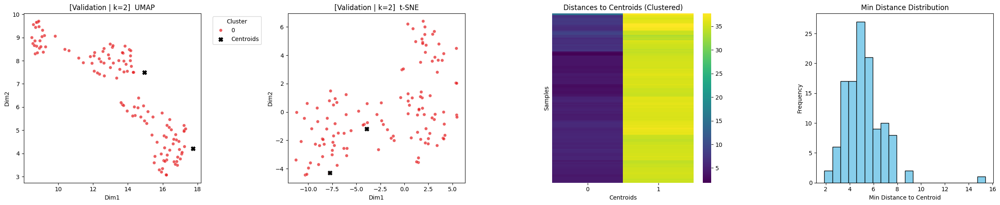

self defined centroid


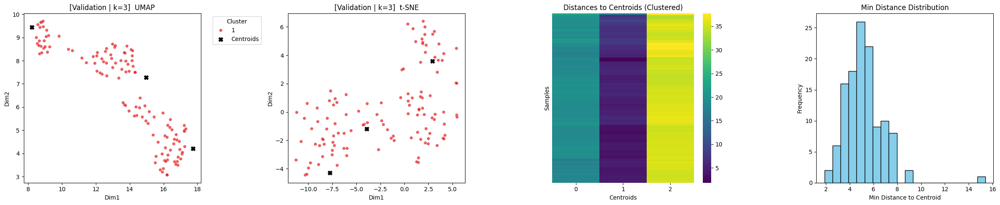

self defined centroid


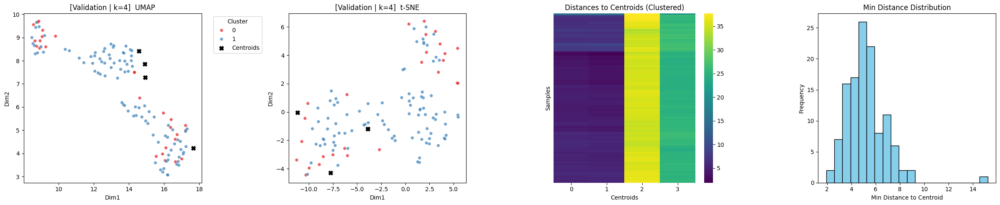

self defined centroid


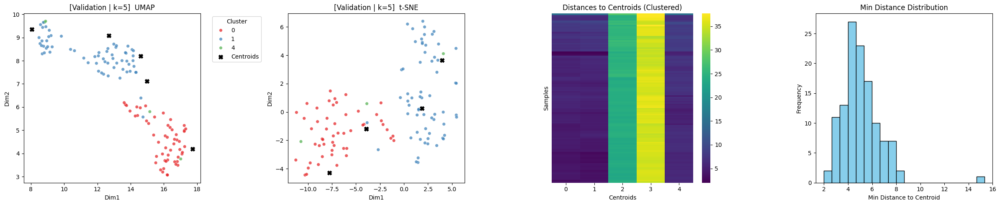

self defined centroid


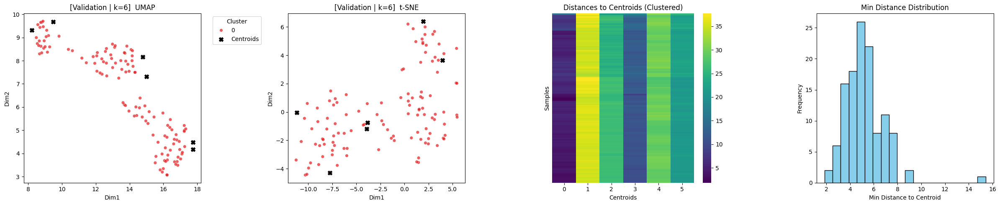

In [ ]:
val = merged_datasets['val'].drop(columns=['label', 'set'])
val_scaled = scale_data( val )

label_val = {}

for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  model = model_dict[k]
  clusters = assign_by_kmeans(val_scaled, model, "Validation" ,k, method='self')
  sample_names = merged_datasets['val'].index.tolist()
  sample_label = merged_datasets['val']['label'].tolist()
  cluster_df = pd.DataFrame({"sample": sample_names,"cluster": clusters,"label": sample_label})
  cluster_df.to_csv(os.path.join(k_dir, f"val_cluster_labels_fulltrain.csv"), index=False)

### Step 3: Clustering on Internal/External Test set

- assign cluster label for validation set using posterior or centroid similarity

- this is for trail of different methods, for the final results generation, refer to setp 4

self defined centroid


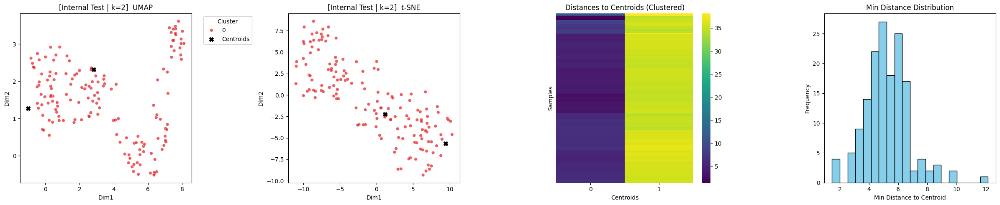

self defined centroid


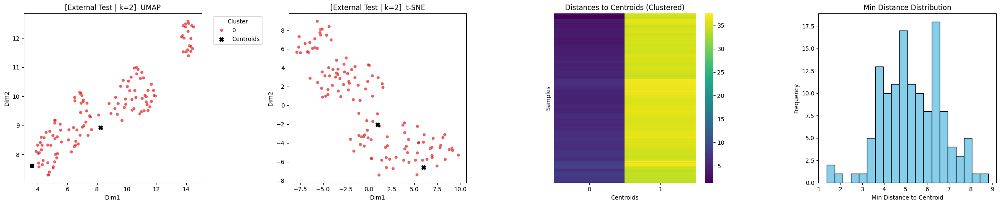

self defined centroid


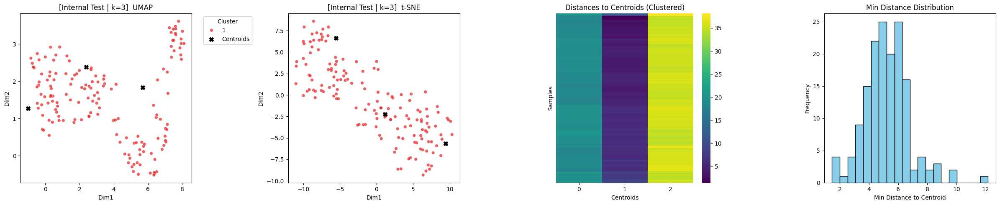

self defined centroid


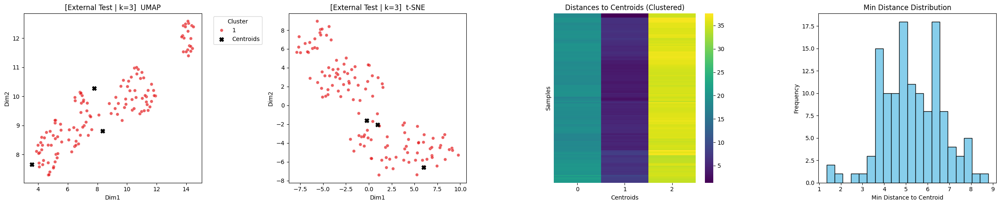

self defined centroid


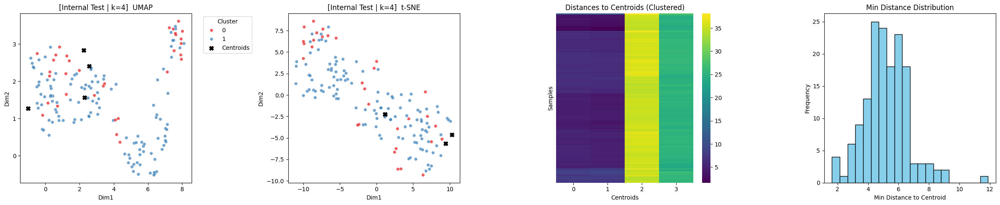

self defined centroid


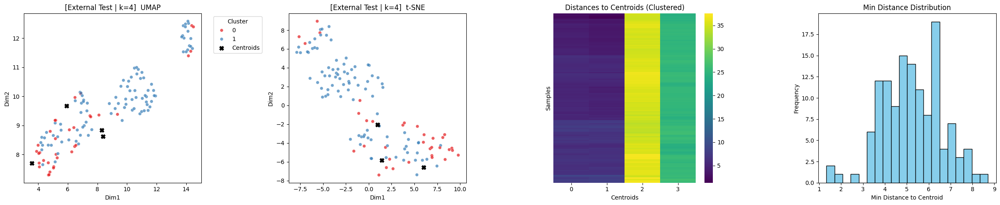

self defined centroid


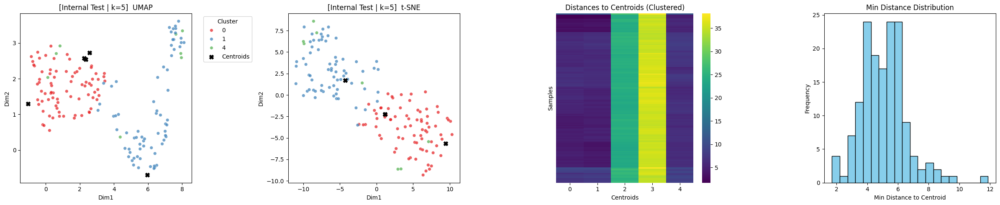

self defined centroid


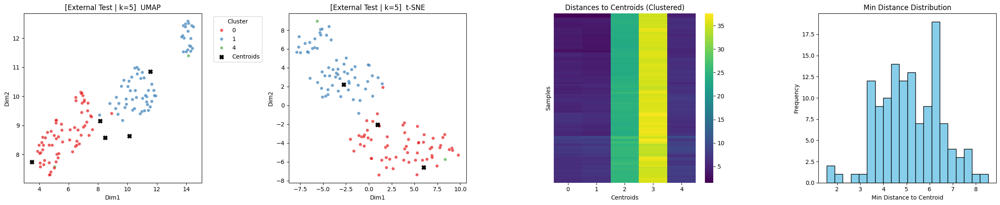

self defined centroid


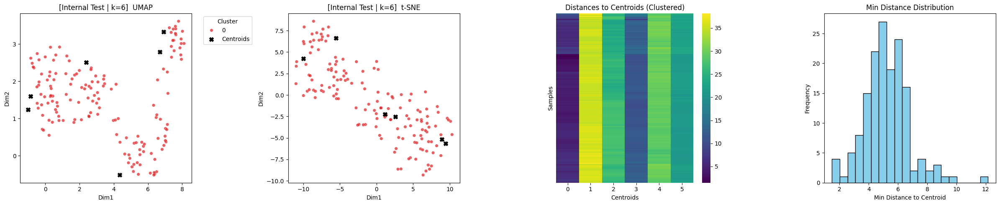

self defined centroid


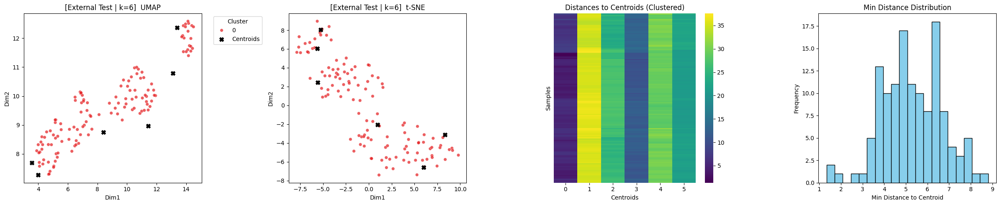

In [ ]:
internal_test = merged_datasets['internal_test'].drop(columns=['label', 'set'])
external_test = merged_datasets['external_test'].drop(columns=['label', 'set'])

internal_test_scaled = scale_data(internal_test)
external_test_scaled = scale_data(external_test)

for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  model = model_dict[k]

  sample_internal = merged_datasets["internal_test"].index.tolist()
  sample_external = merged_datasets["external_test"].index.tolist()
  sample_label_internal = merged_datasets["internal_test"]["label"].tolist()
  sample_label_external = merged_datasets["external_test"]["label"].tolist()

  internal_labels = assign_by_kmeans(internal_test_scaled, model, data_type="Internal Test",n_clusters= k, method='self')
  external_labels = assign_by_kmeans(external_test_scaled, model, data_type="External Test",n_clusters= k, method='self')
  cluster_df_internal = pd.DataFrame({"sample": sample_internal,"cluster": internal_labels, "label": sample_label_internal})
  cluster_df_internal.to_csv(os.path.join(k_dir, f"internal_test_cluster_labels_fulltrain.csv"), index=False)

  cluster_df_external = pd.DataFrame({"sample": sample_external,"cluster": external_labels, "label": sample_label_external})
  cluster_df_external.to_csv(os.path.join(k_dir, f"external_test_cluster_labels_fulltrain.csv"), index=False)


In [ ]:
for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  model = model_dict[k]

  internal_test_cluster_labels, cluster_centroids, train_cluster_labels = assign_by_consensus_centroid(cm_dict[k],train_scaled,internal_test_scaled, k, method='hierarchical', linkage_method='average')
  external_test_cluster_labels, cluster_centroids, train_cluster_labels = assign_by_consensus_centroid(cm_dict[k],train_scaled,external_test_scaled, k, method='hierarchical', linkage_method='average')

### Step 4: Assign cluster by train consensus matrices centroid

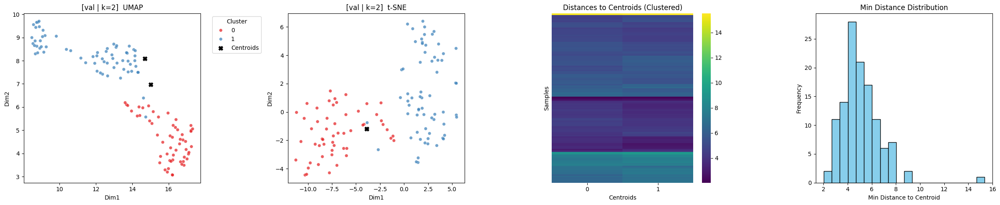

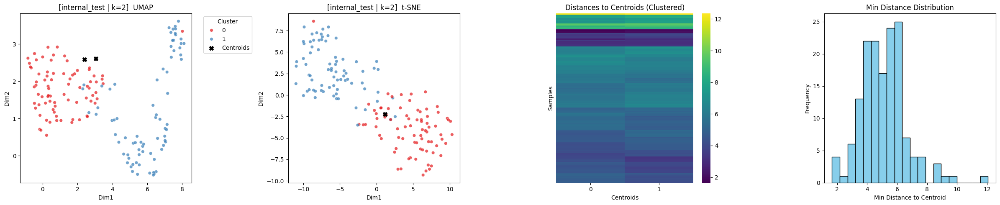

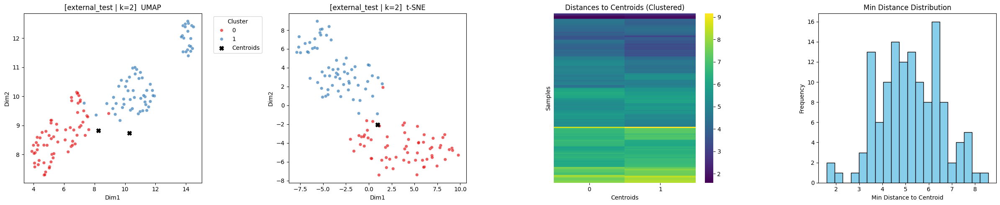

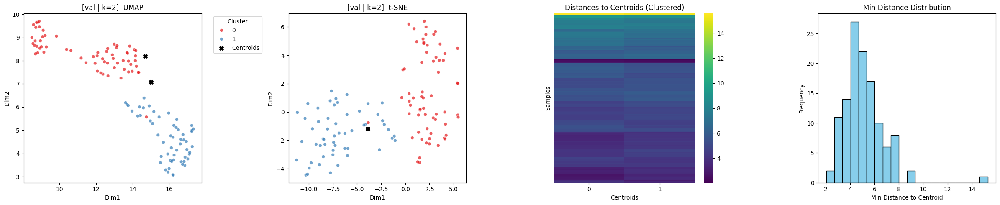

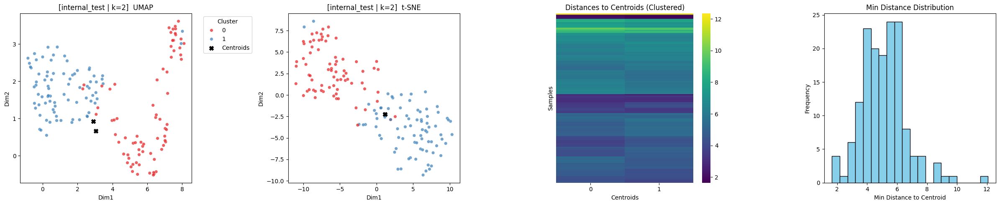

...

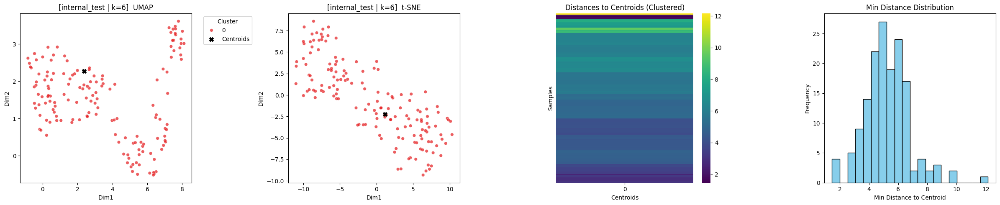

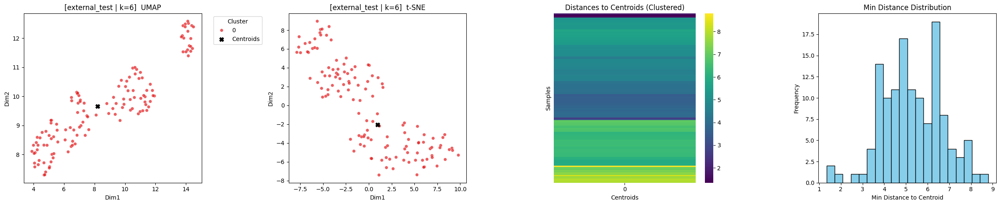

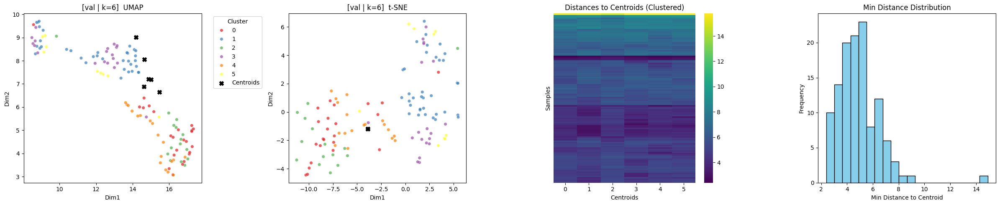

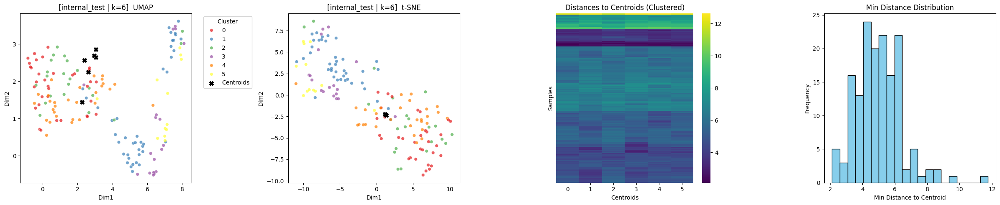

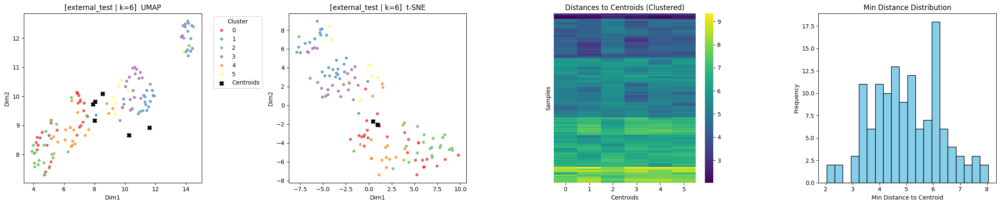

In [ ]:
val = merged_datasets['val'].drop(columns=['label', 'set'])
internal_test = merged_datasets['internal_test'].drop(columns=['label', 'set'])
external_test = merged_datasets['external_test'].drop(columns=['label', 'set'])

val_scaled = scale_data( val )
internal_test_scaled = scale_data(internal_test)
external_test_scaled = scale_data(external_test)

latant_dict={
    "train": train_scaled,
    "val": val_scaled,
    "internal_test": internal_test_scaled,
    "external_test": external_test_scaled
}


sample_map = {
    "train" : merged_datasets['train'].index.tolist(),
    "val" : merged_datasets['val'].index.tolist(),
    "internal_test": merged_datasets["internal_test"].index.tolist(),
    "external_test": merged_datasets["external_test"].index.tolist()
}
label_map = {
    "train" : merged_datasets['train']['label'].tolist(),
    "val": merged_datasets['val']['label'].tolist(),
    "internal_test": merged_datasets["internal_test"]["label"].tolist(),
    "external_test": merged_datasets["external_test"]["label"].tolist()
}

data_set = ['train', 'val', 'internal_test', 'external_test']
linage = ["average", "single", "complete"]

label_cm_dict = {}
model_dict_loaded = {}
cm_dict_load = {}


for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  model_dict_loaded[k] = joblib.load(os.path.join(k_dir, f"{dataset}_kmeans_model.joblib"))
  cm_dict_load[k] = np.load(os.path.join(k_dir, f"{dataset}_consensus_matrix.npy"))

  for m in linage:
    result = assign_by_consensus_centroid(cm_dict_load[k],latant_dict,n_clusters=k,method='hierarchical',linkage_method=m)
    for d in data_set:
      cluster_df = pd.DataFrame({"sample": sample_map[d],"cluster": result["labels"][d],"label": label_map[d]})
      cluster_df.to_csv(os.path.join(k_dir, f"{d}_cluster_labels_consensus_{m}.csv"), index=False)
      if d == "train":
        label_cm_dict[m] = result["labels"][d]

  result_spectral = assign_by_consensus_centroid(cm_dict_load[k],latant_dict,n_clusters=k,method='spectral')
  for d in data_set:
    cluster_df_spectral = pd.DataFrame({"sample": sample_map[d],"cluster": result_spectral["labels"][d],"label": label_map[d]})
    cluster_df_spectral.to_csv(os.path.join(k_dir, f"{d}_cluster_labels_consensus_spectral.csv"), index=False)


### Step 5: Visualizing cluster assignment confidence



#### silhouette score for each bootstrap

(np.float32(0.100616075), np.float32(1.5362803e-05))
0.8253156
(np.float32(0.087026514), np.float32(0.00013023982))
0.74837303
(np.float32(0.09770415), np.float32(5.7535708e-05))
0.16117291
(np.float32(0.10117829), np.float32(0.000116215604))
0.06262245
(np.float32(0.104285434), np.float32(6.110391e-05))
0.52128917


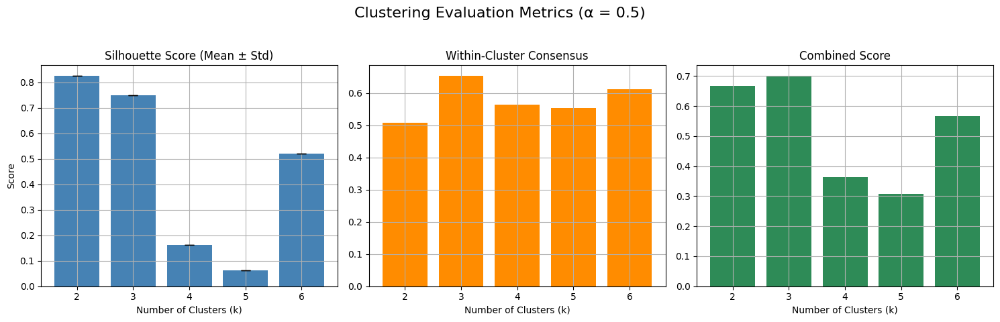

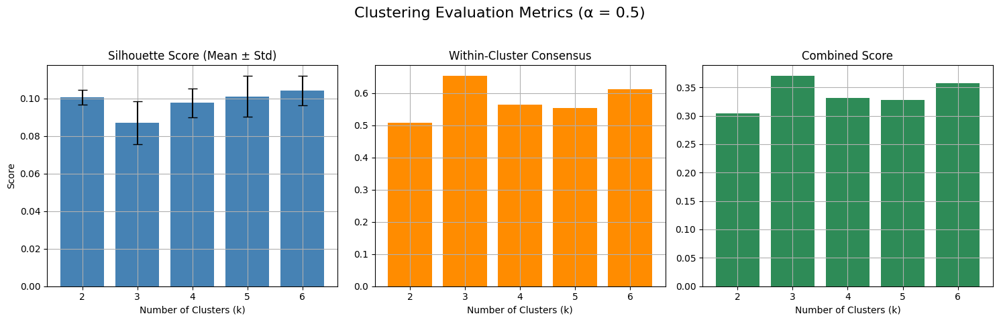

In [ ]:
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_flex/"
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_10_rmOutliers/"
model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_30mixed/"

dataset = "train"
K = range(2,7)
random_seed = 2025

# rename this to avoid conflict!
cm_dict_loaded = {}
label_dict_loaded = {}
model_dict_loaded = {}
silhouette_dict_loaded = {}
silhouette_dict_full_loaded = {}

train = merged_datasets['train'].drop(columns=['label', 'set'])
train_scaled = scale_data( train )

for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")

  # read consensus matrix
  consensus_matrix = np.load(os.path.join(k_dir, f"{dataset}_consensus_matrix.npy"))
  cm_dict_loaded[k] = consensus_matrix

  # extract stable clusters
  stable_clusters = extract_stable_clusters(cm_dict_loaded[k], n_clusters=k, method='spectral', criterion='maxclust')
  label_dict_loaded[k] = stable_clusters

  # read trained model
  model = joblib.load(os.path.join(k_dir, f"{dataset}_kmeans_model.joblib"))
  model_dict_loaded[k] = model

  sil_score_loaded = pickle.load(open(os.path.join(k_dir, f"{dataset}_silhouette_score.pkl"), "rb"))
  silhouette_dict_loaded[k] = sil_score_loaded
  print(sil_score_loaded)

  # compute silhouette score on full training set
  model.fit(train_scaled)
  full_sil = silhouette_score(train_scaled, model.labels_)
  print(full_sil)
  silhouette_dict_full_loaded[k] = (full_sil, 0)

#plot_dendrograms_with_labels(cm_dict_loaded, label_dict_loaded,train_scaled,model_dict_loaded,merged_datasets['train']["label"])
for a in [0.5]:
  plot_silhouette_within_combined_scores_with_variance(train_scaled, label_dict_loaded, cm_dict_loaded, silhouette_dict_full_loaded, a)

for a in [0.5]:
  plot_silhouette_within_combined_scores_with_variance(train_scaled, label_dict_loaded, cm_dict_loaded, silhouette_dict_loaded, a)


#### Silhouette score of consensus matrix

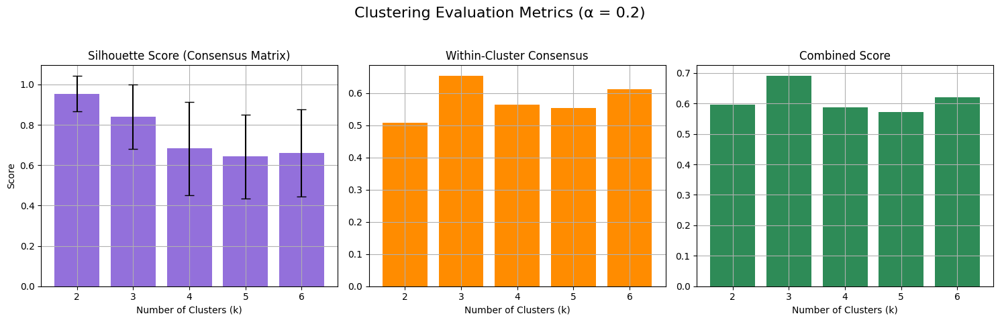

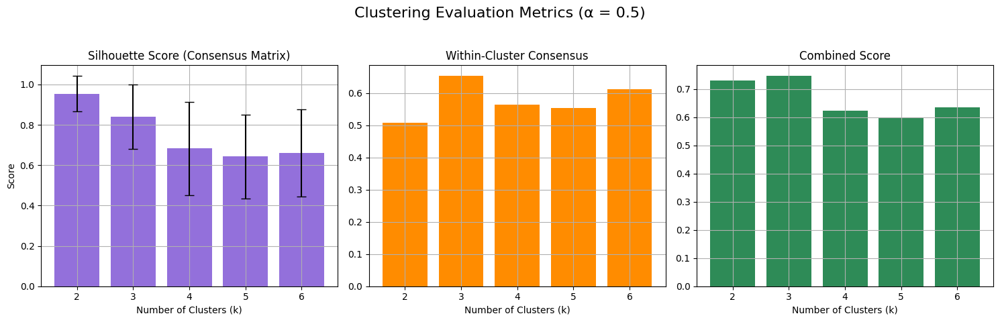

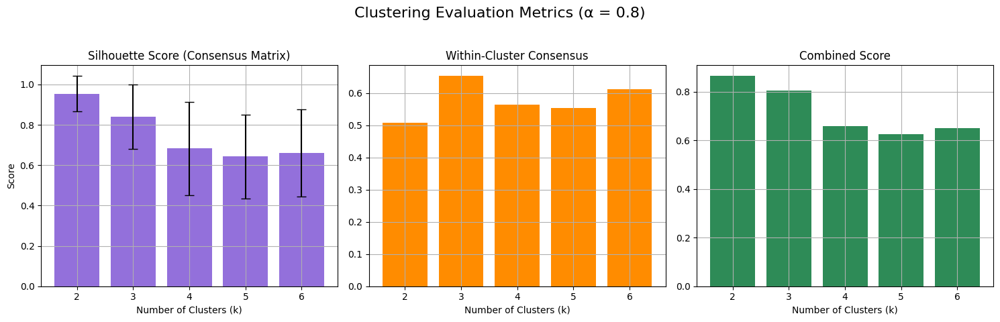

In [ ]:
from sklearn.metrics import silhouette_samples

def plot_silhouette_within_combined_scores_with_variance(X_scaled, label_dict, cm_dict, alpha):
  k_values = sorted(label_dict.keys())
  silhouette_means = []
  silhouette_vars = []
  within_scores = []
  combined_scores = []

  def compute_within_cluster_consensus(consensus_matrix, labels):
    k = np.unique(labels).max()
    total_score = 0
    for cluster_id in range(1, k + 1):
      indices = np.where(labels == cluster_id)[0]
      if len(indices) <= 1:
        continue
      submatrix = consensus_matrix[np.ix_(indices, indices)]
      score = np.sum(submatrix) / (len(indices) * (len(indices) - 1))
      total_score += score * len(indices)
    return total_score / len(labels)

  for k in k_values:
    labels = label_dict[k]
    cm = cm_dict[k]
    if len(set(labels)) > 1:
      dist_matrix = 1 - cm  # Convert consensus to dissimilarity
      sil_samples = silhouette_samples(dist_matrix, labels, metric='precomputed')
      sil_mean = np.mean(sil_samples)
      sil_var = np.var(sil_samples)
      within = compute_within_cluster_consensus(cm, labels)
      combined = alpha * sil_mean + (1 - alpha) * within
    else:
      sil_mean = float('nan')
      sil_var = float('nan')
      within = float('nan')
      combined = float('nan')

    silhouette_means.append(sil_mean)
    silhouette_vars.append(sil_var)
    within_scores.append(within)
    combined_scores.append(combined)

  fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True)

  axes[0].bar(k_values, silhouette_means, yerr=np.sqrt(silhouette_vars), capsize=5, color='mediumpurple')
  axes[0].set_title("Silhouette Score (Consensus Matrix)")
  axes[0].set_xlabel("Number of Clusters (k)")
  axes[0].set_ylabel("Score")
  axes[0].grid(True)
  axes[0].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

  axes[1].bar(k_values, within_scores, color='darkorange')
  axes[1].set_title("Within-Cluster Consensus")
  axes[1].set_xlabel("Number of Clusters (k)")
  axes[1].grid(True)
  axes[1].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

  axes[2].bar(k_values, combined_scores, color='seagreen')
  axes[2].set_title("Combined Score")
  axes[2].set_xlabel("Number of Clusters (k)")
  axes[2].grid(True)
  axes[2].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

  fig.suptitle(f"Clustering Evaluation Metrics (α = {alpha})", fontsize=16)
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

for a in [0.2, 0.5, 0.8]:
  plot_silhouette_within_combined_scores_with_variance(train_scaled, label_dict_loaded, cm_dict_loaded, a)

## Summary of cluster balance

In [ ]:
from scipy.stats import entropy

def analyze_label_balance_entropy(label_dict):
    summary = []

    for k in sorted(label_dict.keys()):
        for dset in label_dict[k].keys():
            for setting in label_dict[k][dset].keys():
                df = label_dict[k][dset][setting]
                cluster_labels = df['cluster']
                #print(f"K: {k}, Dataset: {dset}, Setting: {setting}")
                #print(cluster_labels.value_counts())
                counts = cluster_labels.value_counts().sort_index()
                total = counts.sum()
                probs = counts / total
                K_clusters = len(counts)

                # Shannon entropy
                entropy_val = entropy(probs, base=2)
                normalized_entropy = entropy_val / np.log2(K_clusters) if K_clusters > 1 else 0

                summary.append({
                    "K": k,
                    "dataset": dset,
                    "setting": setting,
                    "n_clusters": K_clusters,
                    "min_size": counts.min(),
                    "max_size": counts.max(),
                    "entropy": round(entropy_val, 3),
                    "normalized_entropy": round(normalized_entropy, 3)
                })

    return pd.DataFrame(summary)

def plot_balance_scores_grouped(balance_df):
  for k_val in sorted(balance_df['K'].unique()):
    df_k = balance_df[balance_df['K'] == k_val].copy()

    legend_map = {
    "fulltrain": "K-means(without Bootstrap)",
    "consensus_average": "Hierarchical(average)",
    "consensus_single": "Hierarchical(single)",
    "consensus_complete": "Hierarchical(complete)",
    "consensus_spectral": "Spectral"
    }

    df_k["setting_legend"] = df_k["setting"].map(legend_map)

    plt.figure(figsize=(8, 4))
    ax = sns.barplot(
        data=df_k,
        x="dataset",
        y="normalized_entropy",
        hue="setting_legend"
    )

    ax.set_ylim(0, 1.05)
    ax.set_title(f"Entropy Comparison for K = {k_val}", fontsize=12)
    ax.set_ylabel("Entropy")
    ax.set_xlabel("Dataset")
    ax.tick_params(axis='x', labelrotation=30)
    plt.legend(title="Dataset", bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

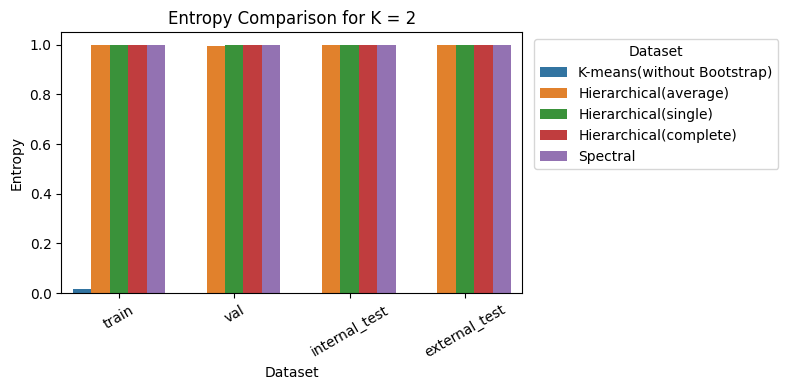

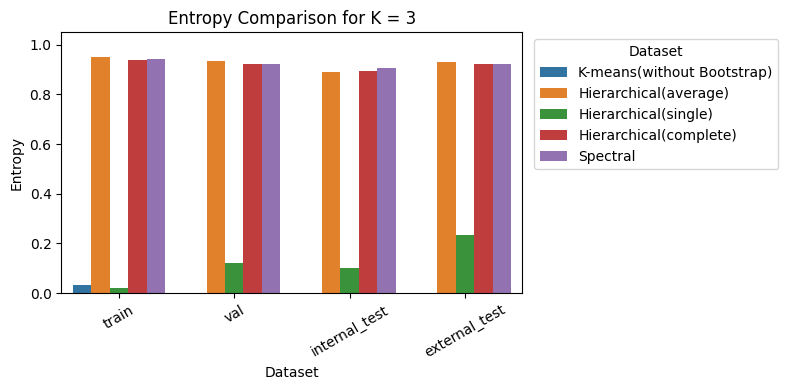

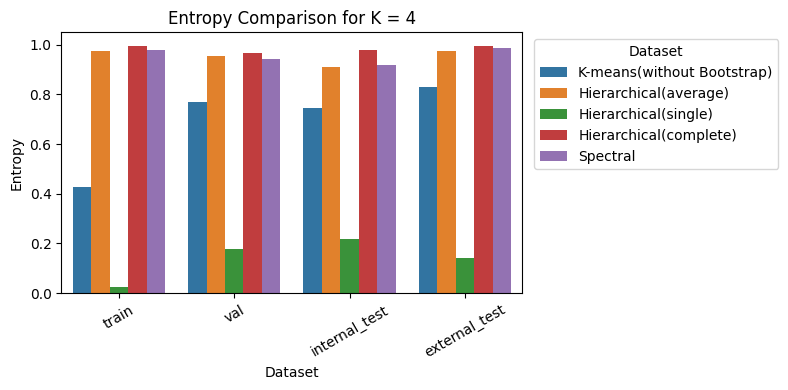

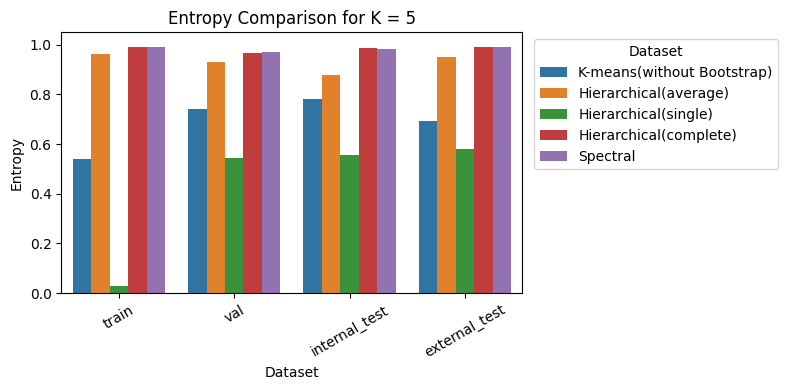

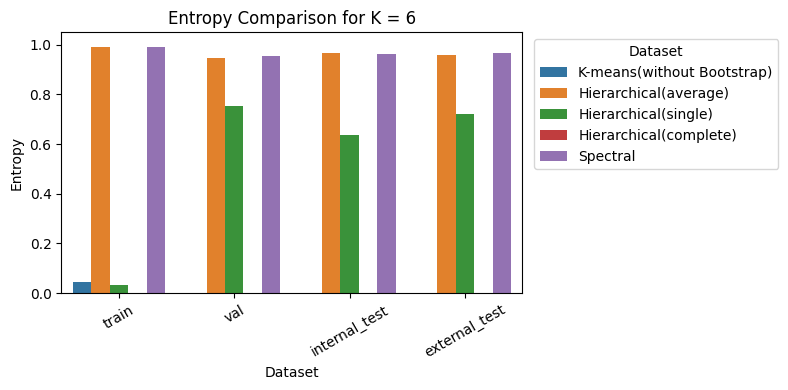

In [ ]:
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_10/"
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_flex/"
#model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_n_init_10_rmOutliers/"
model_dir = data_integration_file_path="/content/drive/MyDrive/DS_project/Data/6_Unsupervised_clustering/kmeans_30mixed/"


K = range(2, 7)

label_dict = {}
settings_list = ["fulltrain", "consensus_average", "consensus_single", "consensus_complete","consensus_spectral"]
#settings_list = ["consensus_average", "consensus_single", "consensus_complete","consensus_spectral"]

datasets = ['train', 'val', 'internal_test', 'external_test']

summary = []
for k in K:
  k_dir = os.path.join(model_dir, f"k_{k}")
  label_dict[k] = {}

  for d in datasets:
    label_dict[k][d] = {}
    for s in settings_list:
      label_path = os.path.join(k_dir, f"{d}_cluster_labels_{s}.csv")
      label_df = pd.read_csv(label_path, index_col=0)
      label_dict[k][d][s] = label_df

summary = analyze_label_balance_entropy(label_dict)
plot_balance_scores_grouped(summary)

## Check dendrograms with different k with labels from different method

In [ ]:
settings_list

['fulltrain',
 'consensus_average',
 'consensus_single',
 'consensus_complete',
 'consensus_spectral']

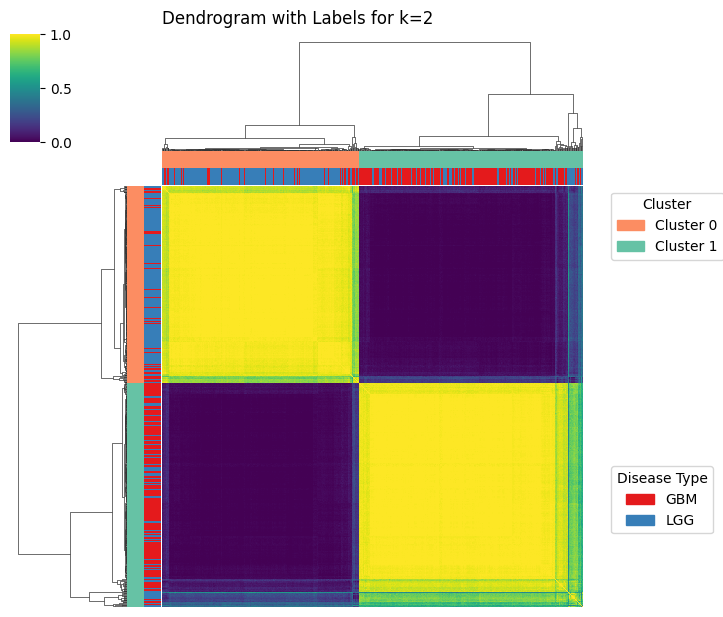

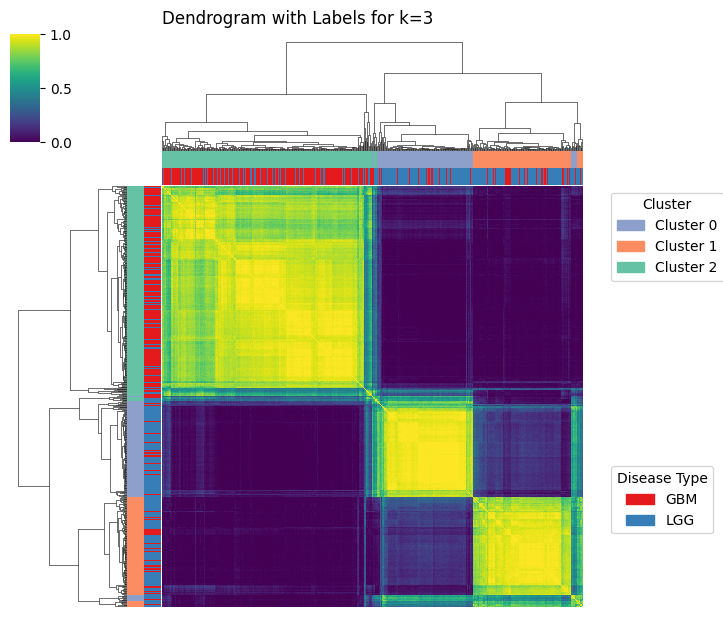

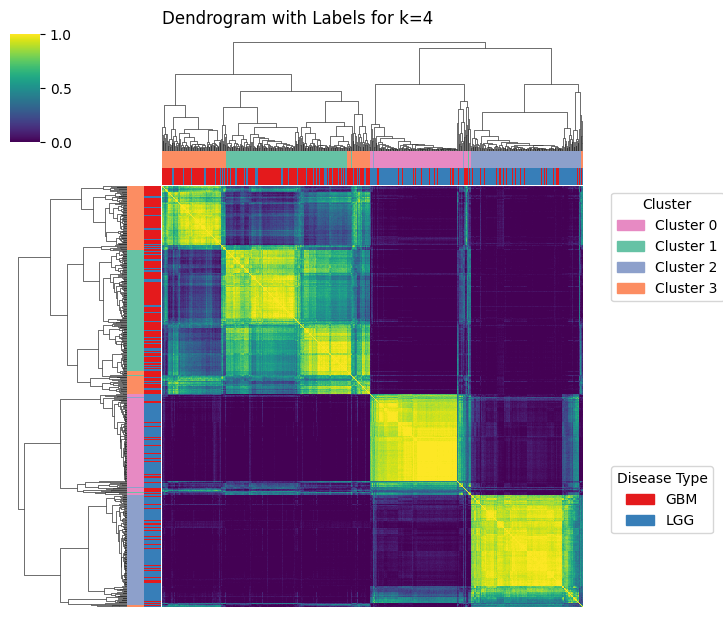

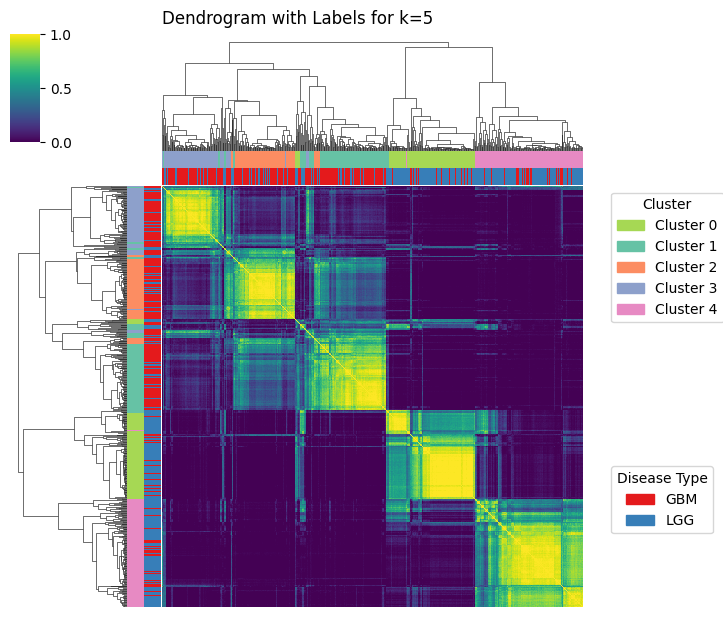

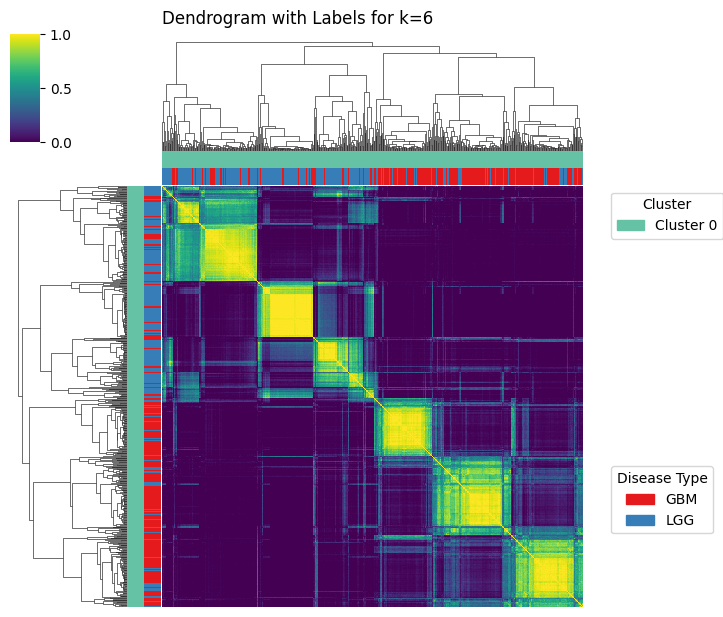

In [ ]:
## Dendrogram
def plot_dendrogram_with_row_colors(consensus_matrix, cluster_labels, X, model, sample_metadata=None, method="average", title="Dendrogram with Cluster Labels"):
    n_samples = consensus_matrix.shape[0]

    # Ensure input is numpy array
    consensus_matrix = np.array(consensus_matrix)
    cluster_labels = np.asarray(cluster_labels)

    if sample_metadata is not None:
        disease_labels = np.asarray(sample_metadata)
    else:
        disease_labels = np.array(["Unknown"] * n_samples)

    # === Cluster colors
    unique_clusters = pd.unique(cluster_labels)
    cluster_palette = sns.color_palette("Set2", len(unique_clusters))
    cluster_color_map = {lab: cluster_palette[i] for i, lab in enumerate(unique_clusters)}
    cluster_colors = np.array([cluster_color_map[lab] for lab in cluster_labels])

    # === Disease colors
    unique_diseases = pd.unique(disease_labels)
    disease_palette = sns.color_palette("Set1", len(unique_diseases))
    disease_color_map = {lab: disease_palette[i] for i, lab in enumerate(unique_diseases)}
    # Create disease_colors based on the disease label for each sample
    disease_colors = np.array([disease_color_map[d] for d in disease_labels])


    # === Combine color strips
    row_colors = np.stack([cluster_colors, disease_colors], axis=0)

    # === Dendrogram
    similarity = consensus_matrix.copy()
    np.fill_diagonal(similarity, 1.0)
    distance = 1 - similarity
    Z = linkage(pdist(distance), method=method)

    g=sns.clustermap(
      similarity,
      row_linkage=Z,
      col_linkage=Z,
      row_colors=row_colors,
      col_colors=row_colors,
      cmap="viridis",
      xticklabels=False,
      yticklabels=False,
      figsize=(6, 6)
    )
    plt.suptitle(title, y=1.02)
    cluster_legend = [mpatches.Patch(color=cluster_color_map[k], label=f"Cluster {k}") for k in sorted(cluster_color_map.keys())]
    disease_legend = [mpatches.Patch(color=disease_color_map[d], label=str(d)) for d in sorted(disease_color_map.keys())]

    ax = g.ax_heatmap
    legend1 = ax.legend(handles=cluster_legend, title="Cluster", loc='upper left', bbox_to_anchor=(1.05, 1))
    ax.add_artist(legend1)
    ax.legend(handles=disease_legend, title="Disease Type", loc='upper left', bbox_to_anchor=(1.05, 0.35))

    plt.show()

def plot_dendrograms_with_labels(cm_dict, label_dict,X,model_dict, meta_dict=None, method="average"):
  for k in sorted(cm_dict.keys()):
    cm = cm_dict[k]
    labels = label_dict[k]
    meta_labels = meta_dict[k] if meta_dict and k in meta_dict else None
    title = f"Dendrogram with Labels for k={k}"
    plot_dendrogram_with_row_colors(cm, labels,X,model_dict[k],sample_metadata=meta_labels, method=method, title=title)

# Iterate through settings and plot dendrograms for training data
for setting in settings_list:
  if setting == "consensus_complete":
    # Create a temporary dictionary with the structure expected by plot_dendrograms_with_labels
    temp_label_dict = {k: label_dict[k]['train'][setting]['cluster'] for k in K}
    meta_labels_dict = {k: label_dict[k]['train'][setting]['label'] for k in K} # Assuming metadata is the same across settings for a given k and dataset
    plot_dendrograms_with_labels(cm_dict_loaded, temp_label_dict, train_scaled, model_dict_loaded, meta_dict=meta_labels_dict, method="complete")

In [ ]:
print(label_dict[2])

{'train': {'fulltrain':                   cluster label
sample                         
TCGA-02-0001-01C        0   GBM
TCGA-02-0003-01A        0   GBM
TCGA-02-0007-01A        0   GBM
TCGA-02-0010-01A        1   GBM
TCGA-02-0014-01A        1   GBM
...                   ...   ...
TCGA-WY-A858-01A        0   LGG
TCGA-WY-A85A-01A        1   LGG
TCGA-WY-A85B-01A        1   LGG
TCGA-WY-A85D-01A        1   LGG
TCGA-WY-A85E-01A        1   LGG

[621 rows x 2 columns], 'consensus':                   cluster label
sample                         
TCGA-02-0001-01C        1   GBM
TCGA-02-0003-01A        1   GBM
TCGA-02-0007-01A        1   GBM
TCGA-02-0010-01A        1   GBM
TCGA-02-0014-01A        1   GBM
...                   ...   ...
TCGA-WY-A858-01A        1   LGG
TCGA-WY-A85A-01A        1   LGG
TCGA-WY-A85B-01A        2   LGG
TCGA-WY-A85D-01A        1   LGG
TCGA-WY-A85E-01A        1   LGG

[621 rows x 2 columns]}, 'val': {'fulltrain':                   cluster label
sample                     